# Георадарограммы железнодорожных тоннелей: проверка данных и прогон детекторов
### Байкальский и Северомуйский тоннели, отчёты 2016–2022

Этот ноутбук работает с каталогом **`docs/images/`** — 699 георадарограмм,
извлечённых из четырнадцати ведомственных отчётов формата `.doc` о георадарном
обследовании двух действующих железнодорожных тоннелей. Описание каждого
изображения лежит рядом, в `docs/desc/`.

Почему это важно именно для нашей работы. В основном ноутбуке
(`gpr_tunnel_defects_detection.ipynb`) детектор обучался на том, что нашлось в
открытом доступе: синтетика FDTD, дорожные съёмки, лабораторный железобетон,
облицовка канала. Целевого домена — **реальной железнодорожной тоннельной обделки** —
там не было, и это стояло первым пунктом в ограничениях работы. Здесь он появляется.

| | |
|---|---|
| Объекты | Байкальский тоннель (1 и 2 путь), Северомуйский тоннель, тоннели обхода СМТ |
| Период | ноябрь 2016 — июнь 2022 |
| Аппаратура | георадар «Око-2», антенный блок АБ-1700 (зондирование бетона), обработка «Геоскан-32» |
| Глубина зондирования | до 1.6–2 м по данным отчётов |
| Разметка | **рамок нет**; есть текстовая расшифровка инженера на уровне документа |

**План.** Сначала убедиться, что в каталоге действительно только радарограммы и
ничего постороннего. Затем разведочный анализ: что это за съёмки, чем они
отличаются друг от друга, нет ли повторов. Потом прогон наших моделей и разбор
того, что они находят, — с контрольной группой, без которой на неразмеченных данных
любые находки недоказуемы.

In [1]:
import os, re, json, hashlib, warnings
from pathlib import Path
from collections import Counter, defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatch
from PIL import Image

warnings.filterwarnings("ignore")
pd.set_option("display.width", 200)
pd.set_option("display.max_columns", 40)
pd.set_option("display.max_colwidth", 60)
plt.rcParams.update({"figure.dpi": 110, "font.size": 9, "axes.grid": True,
                     "grid.alpha": 0.25, "axes.spines.top": False, "axes.spines.right": False})

ROOT = Path.cwd()
IMAGES = ROOT / "docs" / "images"
DESC = ROOT / "docs" / "desc"
RUNS = ROOT / "runs"
SEED = 42
rng = np.random.default_rng(SEED)

import torch
from ultralytics import YOLO
DEVICE = 0 if torch.cuda.is_available() else "cpu"

print(f"изображений в {IMAGES.relative_to(ROOT)}: {len(list(IMAGES.iterdir()))}")
print(f"описаний в {DESC.relative_to(ROOT)}: {len(list(DESC.glob('*.txt')))}")
print(f"устройство: {DEVICE}")

изображений в docs/images: 695
описаний в docs/desc: 695
устройство: 0


---
## 1. Загрузка

Изображение и его описание связаны именем файла. Из описания берутся сведения,
которые нельзя восстановить из самой картинки: документ-источник, объект и то, какие
дефекты упомянуты в тексте отчёта.

In [2]:
FIELDS = {"документ": r"документ\s*:\s*(.+)", "объект": r"объект\s*:\s*(.+)",
          "упоминания": r"упоминания в тексте отчёта:\s*(.+)"}


def read_desc(stem):
    p = DESC / f"{stem}.txt"
    if not p.exists():
        return {}
    t = p.read_text(encoding="utf-8")
    out = {k: (m.group(1).strip() if (m := re.search(v, t)) else "") for k, v in FIELDS.items()}
    frag = re.search(r"фрагменты расшифровки с упоминанием дефектов:\n(.*?)\n\n", t, re.S)
    out["фрагменты"] = frag.group(1).strip() if frag else ""
    return out


rows = []
for p in sorted(IMAGES.iterdir()):
    if p.suffix.lower() not in (".png", ".jpg", ".jpeg"):
        continue
    try:
        with Image.open(p) as im:
            w, h = im.size
            mode = im.mode
    except Exception as e:
        print(f"не открывается: {p.name} ({e})")
        continue
    rows.append({"файл": str(p), "имя": p.name, "stem": p.stem, "формат": p.suffix.lstrip(".").lower(),
                 "w": w, "h": h, "режим": mode, "байт": p.stat().st_size, **read_desc(p.stem)})

df = pd.DataFrame(rows)
df["месяц отчёта"] = df["документ"].str.extract(
    r"(январ|феврал|март|апрел|май|мая|июн|июл|август|сентябр|октябр|нояб|декабр)", flags=re.I)[0].str.lower()
df["год"] = df["документ"].str.extract(r"(20\d{2})")[0]
print(f"загружено: {len(df)} изображений, все читаются")
display(df[["имя", "объект", "w", "h", "формат", "упоминания"]].head(5))

загружено: 695 изображений, все читаются


,имя,объект,w,h,формат,упоминания
0,6_Ведомость_георадарограмм_с_расшифровкой_БТ2_июнь_2022_...,Байкальский тоннель,459,252,jpg,"трещины, обводнённость, арматура"
1,6_Ведомость_георадарограмм_с_расшифровкой_БТ2_июнь_2022_...,Байкальский тоннель,465,255,jpg,"трещины, обводнённость, арматура"
2,6_Ведомость_георадарограмм_с_расшифровкой_БТ2_июнь_2022_...,Байкальский тоннель,494,271,png,"трещины, обводнённость, арматура"
3,6_Ведомость_георадарограмм_с_расшифровкой_БТ2_июнь_2022_...,Байкальский тоннель,494,271,png,"трещины, обводнённость, арматура"
4,6_Ведомость_георадарограмм_с_расшифровкой_БТ2_июнь_2022_...,Байкальский тоннель,464,254,png,"трещины, обводнённость, арматура"


---
## 2. Проверка: в каталоге только георадарограммы?

Изображения отбирались автоматическим правилом при выгрузке из `.doc`. Проверять их
тем же правилом бессмысленно — это лишь повторит исходное решение. Нужна независимая
проверка, и для неё нужны **заведомо отрицательные примеры**.

Они есть: в тех же четырнадцати отчётах лежат фотографии обделки, пути и аппаратуры.
Они точно не георадарограммы. По ним и калибруются пороги, а затем те же пороги
применяются к каталогу.

In [3]:
def verify_features(path):
    """Признаки для отделения радарограмм от всего остального."""
    im = Image.open(path).convert("RGB")
    a = np.asarray(im).astype(np.float32)
    h, w, _ = a.shape
    g = a.mean(2)
    b = 8
    border = np.concatenate([g[:b].ravel(), g[-b:].ravel(), g[:, :b].ravel(), g[:, -b:].ravel()])
    inner = g[b:-b, b:-b] if h > 2 * b and w > 2 * b else g
    if inner.shape[0] < 4 or inner.shape[1] < 4:
        inner = g
    r = inner - inner.mean(1, keepdims=True)
    step = max(1, r.shape[0] // 40)
    row_corr = float(np.nanmean([np.corrcoef(r[i], r[i + 1])[0, 1]
                                 for i in range(0, r.shape[0] - 1, step)]))
    return dict(белая_рамка=float((border > 230).mean()),
                белое_внутри=float((inner > 240).mean()),
                корреляция_строк=row_corr,
                контраст=float(inner.std()),
                насыщенность=float((a.max(2) - a.min(2)).mean()),
                яркость=float(g.mean()))


# отрицательные примеры: фотографии из тех же .doc, они лежат в рабочем каталоге
CONTROL = ROOT / "work" / "docs_images"
if not (CONTROL / "manifest.json").exists():
    os.system(f"{os.sys.executable} tools/docs_extract.py docs {CONTROL}")
ctrl_manifest = json.loads((CONTROL / "manifest.json").read_text())

neg_rows, control_files = [], []
for m in ctrl_manifest:
    if not m["документ"].lower().endswith(".doc"):
        continue
    try:
        f = verify_features(m["файл"])
    except Exception:
        continue
    if f["белая_рамка"] < 0.35:                 # тёмные снимки из тоннеля
        neg_rows.append(f); control_files.append(m["файл"])

feat = pd.DataFrame([verify_features(f) for f in df["файл"]])
chk = pd.concat([df.reset_index(drop=True), feat], axis=1)
neg = pd.DataFrame(neg_rows)
print(f"каталог: {len(chk)} изображений | отрицательных примеров (фотографий): {len(neg)}")

каталог: 695 изображений | отрицательных примеров (фотографий): 96


### 2.1. Чем радарограмма отличается от фотографии

Здесь стоит остановиться, потому что первая версия этой проверки была построена на
неверном предположении. Казалось естественным, что георадарограмма «слоистая», то
есть соседние строки у неё похожи, а у фотографии — нет. Измерение говорит ровно
обратное: **фотография гладкая** (корреляция соседних строк 0.97), а радарограмма —
высокочастотная, почти шумовая (медиана 0.24). Порог, поставленный по ошибочной
интуиции, пометил как подозрительные более половины каталога.

Ниже — три признака с порогами, подобранными по фактическому разделению групп.

In [4]:
cmp_rows = []
for col in ["белая_рамка", "белое_внутри", "корреляция_строк", "контраст", "яркость"]:
    cmp_rows.append({"признак": col,
                     "радарограммы: медиана": round(chk[col].median(), 3),
                     "радарограммы: 5–95%": f"{chk[col].quantile(.05):.3f} … {chk[col].quantile(.95):.3f}",
                     "фотографии: медиана": round(neg[col].median(), 3),
                     "фотографии: 5–95%": f"{neg[col].quantile(.05):.3f} … {neg[col].quantile(.95):.3f}"})
display(pd.DataFrame(cmp_rows))

RULES = {
    "это график, а не снимок (белая рамка ≥ 0.5)": lambda d: d["белая_рамка"] >= 0.5,
    "это не фотография (корреляция строк < 0.95)": lambda d: d["корреляция_строк"] < 0.95,
    "это не диаграмма и не скриншот (белое внутри < 0.40)": lambda d: d["белое_внутри"] < 0.40,
}
res = []
for name, rule in RULES.items():
    res.append({"критерий": name,
                "проходят радарограммы": f"{rule(chk).mean() * 100:.1f}%",
                "проходят фотографии": f"{rule(neg).mean() * 100:.1f}%"})
display(pd.DataFrame(res))

ok_pos = np.logical_and.reduce([rule(chk) for rule in RULES.values()])
ok_neg = np.logical_and.reduce([rule(neg) for rule in RULES.values()])
print(f"все три критерия сразу: каталог {int(ok_pos.sum())}/{len(chk)}, "
      f"фотографии {int(ok_neg.sum())}/{len(neg)}")
chk["подозрительна"] = ~ok_pos

,признак,радарограммы: медиана,радарограммы: 5–95%,фотографии: медиана,фотографии: 5–95%
0,белая_рамка,0.923,0.751 … 0.956,0.000,0.000 … 0.058
1,белое_внутри,0.016,0.000 … 0.099,0.000,0.000 … 0.061
2,корреляция_строк,0.240,-0.207 … 0.830,0.969,0.930 … 0.991
3,контраст,39.794,22.385 … 54.663,37.887,14.169 … 77.500
4,яркость,155.527,121.256 … 197.158,67.250,20.220 … 146.604


,критерий,проходят радарограммы,проходят фотографии
0,"это график, а не снимок (белая рамка ≥ 0.5)",100.0%,0.0%
1,это не фотография (корреляция строк < 0.95),100.0%,24.0%
2,это не диаграмма и не скриншот (белое внутри < 0.40),100.0%,100.0%


все три критерия сразу: каталог 695/695, фотографии 0/96


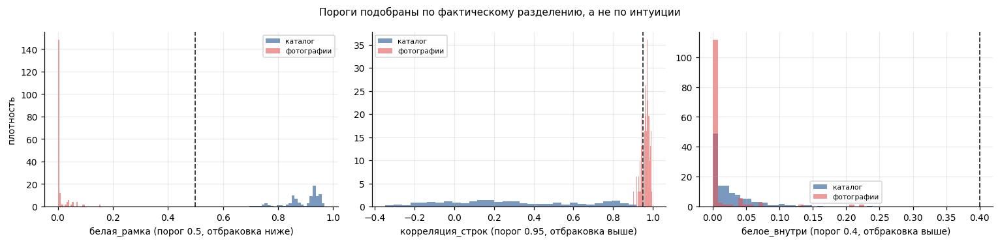

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(14, 3.4))
for ax, col, thr, side in [(axes[0], "белая_рамка", 0.5, "ниже"),
                           (axes[1], "корреляция_строк", 0.95, "выше"),
                           (axes[2], "белое_внутри", 0.40, "выше")]:
    ax.hist(chk[col], bins=30, alpha=0.75, color="#4C78A8", density=True, label="каталог")
    ax.hist(neg[col], bins=30, alpha=0.6, color="#E45756", density=True, label="фотографии")
    ax.axvline(thr, color="#333", ls="--", lw=1.2)
    ax.set_xlabel(f"{col} (порог {thr}, отбраковка {side})"); ax.legend(fontsize=7)
axes[0].set_ylabel("плотность")
plt.suptitle("Пороги подобраны по фактическому разделению, а не по интуиции", fontsize=10)
plt.tight_layout(); plt.show()

### 2.2. Просмотр краёв распределения

Числа могут совпасть случайно, поэтому смотрим глазами — и не случайную выборку, где
всё будет хорошо, а то, что ближе всего к каждому порогу.

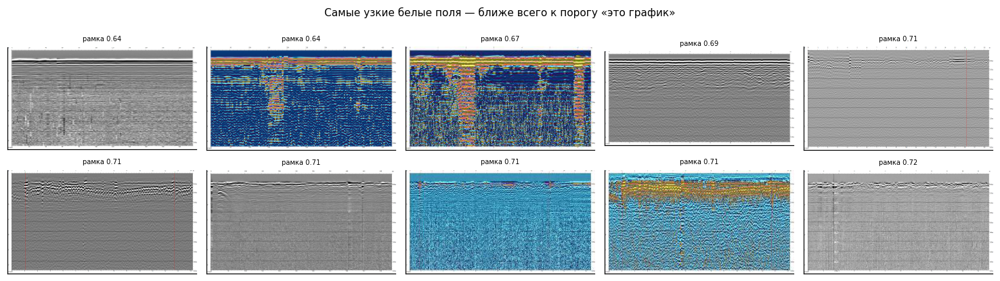

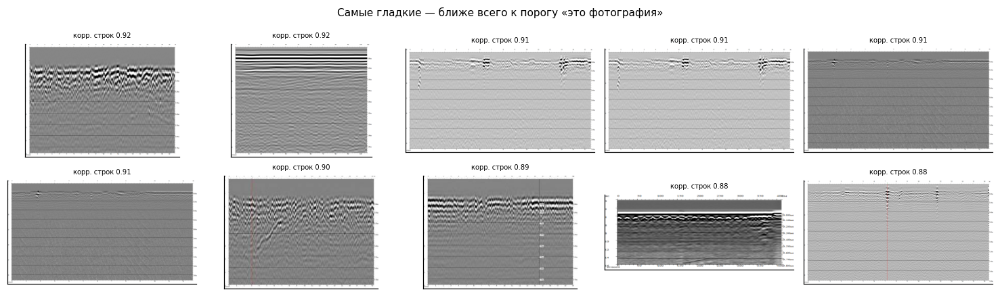

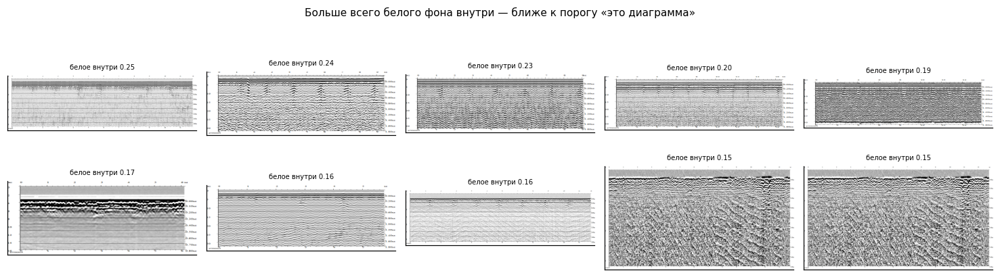

In [6]:
def sheet(sub, title, cols=5, cap=None):
    sub = sub.reset_index(drop=True)
    rows_n = int(np.ceil(len(sub) / cols))
    fig, axes = plt.subplots(rows_n, cols, figsize=(cols * 2.7, rows_n * 2.0))
    for ax, (_, r) in zip(np.atleast_1d(axes).ravel(), sub.iterrows()):
        ax.imshow(np.asarray(Image.open(r["файл"]).convert("RGB")))
        ax.set_title(cap(r) if cap else r["имя"][:28], fontsize=6.5)
        ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
    for ax in np.atleast_1d(axes).ravel()[len(sub):]:
        ax.axis("off")
    plt.suptitle(title, fontsize=10); plt.tight_layout(); plt.show()


sheet(chk.nsmallest(10, "белая_рамка"), "Самые узкие белые поля — ближе всего к порогу «это график»",
      cap=lambda r: f"рамка {r['белая_рамка']:.2f}")
sheet(chk.nlargest(10, "корреляция_строк"), "Самые гладкие — ближе всего к порогу «это фотография»",
      cap=lambda r: f"корр. строк {r['корреляция_строк']:.2f}")
sheet(chk.nlargest(10, "белое_внутри"), "Больше всего белого фона внутри — ближе к порогу «это диаграмма»",
      cap=lambda r: f"белое внутри {r['белое_внутри']:.2f}")

**Что дала проверка.**

Разделение оказалось полным: все 695 изображений каталога проходят три критерия, ни
одна из 96 фотографий не проходит. По самому сильному признаку — доле белого по
периметру — группы не пересекаются даже хвостами: у радарограмм 5-й процентиль 0.75,
у фотографий 95-й процентиль 0.06.

Это не первая версия каталога. В ней через фильтр прошли четыре посторонних
изображения, и нашлись они именно на листах с краями распределения: отсканированная
подпись от руки, снимок экрана программы обработки и две столбчатые диаграммы
«Протяжённость дефектов путевого бетона по годам». Все четыре имеют белые поля и
достаточный контраст, поэтому двум исходным критериям удовлетворяли; отличает их
доля белого фона **внутри** рамки — 0.45–0.94 против 0.25 у ближайшей радарограммы.
Критерий добавлен в `tools/docs_images_export.py`, каталог пересобран, стало 695 файлов.

Полным доказательством это не является: правило выгрузки и проверка опираются на
родственные признаки. Но пороги теперь откалиброваны по независимой отрицательной
группе, а не по интуиции, и ровно эта процедура уже один раз нашла ошибку.

---
## 3. Разведочный анализ

### 3.1. Из чего состоит набор

In [7]:
by_obj = (chk.groupby(["объект", "документ"])
             .agg(кадров=("имя", "size"), медиана_ширины=("w", "median"),
                  медиана_высоты=("h", "median"))
             .reset_index().sort_values(["объект", "документ"]))
display(by_obj)
print(f"объектов: {chk['объект'].nunique()}, документов: {chk['документ'].nunique()}, "
      f"кадров: {len(chk)}")

,объект,документ,кадров,медиана_ширины,медиана_высоты
0,Байкальский тоннель,6. Ведомость георадарограмм с расшифровкой БТ2 июнь 2022...,8,464.5,254.5
1,Байкальский тоннель,6. Ведомость георадарограмм с расшифровкой БТ2 май 2022 ...,6,660.0,304.0
2,Байкальский тоннель,Георадарное_обследованиеБТ2_август2017.doc,50,380.0,115.0
3,Байкальский тоннель,Георадарное_обследованиеБТ2_декабрь2017.doc,72,409.0,119.0
4,Байкальский тоннель,Георадарное_обследованиеБТ2_нояб2017.doc,43,408.0,119.0
5,Байкальский тоннель,Георадарное_обследованиеБТ2_окт2017_001.doc,70,408.0,119.0
6,Байкальский тоннель,Георадарное_обследованиеБТ2_окт2017_002.doc,85,408.0,119.0
7,Северомуйский тоннель,6. Результаты георадарного сканирования Северомуйского т...,46,322.0,176.0
8,Северомуйский тоннель,6. Результаты георадарного сканирования Северомуйского т...,32,661.0,362.0
9,Северомуйский тоннель,6. Результаты георадарного сканирования Северомуйского т...,32,661.0,362.0


объектов: 3, документов: 14, кадров: 695


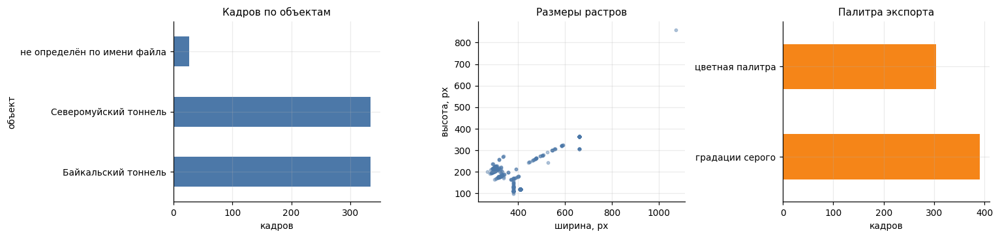

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(14, 3.4))
chk["объект"].value_counts().plot.barh(ax=axes[0], color="#4C78A8")
axes[0].set_title("Кадров по объектам", fontsize=10); axes[0].set_xlabel("кадров")
axes[1].scatter(chk["w"], chk["h"], s=8, alpha=0.4, color="#4C78A8")
axes[1].set_xlabel("ширина, px"); axes[1].set_ylabel("высота, px")
axes[1].set_title("Размеры растров", fontsize=10)
pal = np.where(chk["насыщенность"] < 8, "градации серого", "цветная палитра")
pd.Series(pal).value_counts().plot.barh(ax=axes[2], color="#F58518")
axes[2].set_title("Палитра экспорта", fontsize=10); axes[2].set_xlabel("кадров")
plt.tight_layout(); plt.show()
chk["палитра"] = pal

### 3.2. Повторы

Отчёты за соседние месяцы могут содержать одни и те же профили, а иногда и вовсе
оказываются копией друг друга. Для обучения это критично: одинаковые кадры в
обучении и контроле дают завышенную оценку. Поэтому повторы ищутся дважды —
побайтно и перцептивно.

In [9]:
chk["md5"] = [hashlib.md5(Path(f).read_bytes()).hexdigest() for f in chk["файл"]]
dups = chk["md5"].duplicated(keep=False)
groups = chk[dups].groupby("md5")["имя"].apply(list)
print(f"точных копий: {int(dups.sum())} кадров в {len(groups)} группах; "
      f"уникальных файлов {chk['md5'].nunique()} из {len(chk)}")

cross = 0
for _, names in groups.items():
    docs_ = {chk.loc[chk['имя'] == n, 'документ'].iloc[0] for n in names}
    cross += len(docs_) > 1
print(f"из них групп, где копии лежат в РАЗНЫХ документах: {cross}")

same_docs = defaultdict(list)
for d in chk["документ"].unique():
    h = hashlib.md5((ROOT / "docs" / d).read_bytes()).hexdigest() if (ROOT / "docs" / d).exists() else d
    same_docs[h].append(d)
identical = [v for v in same_docs.values() if len(v) > 1]
if identical:
    print("\nдокументы, совпадающие побайтно (разные имена, один и тот же файл):")
    for v in identical:
        for name in v:
            print(f"  · {name}")

точных копий: 154 кадров в 76 группах; уникальных файлов 617 из 695
из них групп, где копии лежат в РАЗНЫХ документах: 74

документы, совпадающие побайтно (разные имена, один и тот же файл):
  · 6. Результаты георадарного сканирования Северомуйского тоннеля июль.doc
  · 6. Результаты георадарного сканирования Северомуйского тоннеля июнь.doc


In [10]:
try:
    import imagehash
    chk["phash"] = [str(imagehash.phash(Image.open(f).convert("L").resize((256, 256))))
                    for f in chk["файл"]]
    ph = chk["phash"].duplicated(keep=False)
    print(f"перцептивно совпадающих кадров: {int(ph.sum())} в {chk.loc[ph, 'phash'].nunique()} группах")
    print(f"перцептивно уникальных: {chk['phash'].nunique()} из {len(chk)}")
except ImportError:
    print("imagehash недоступен — перцептивная проверка пропущена")

перцептивно совпадающих кадров: 160 в 78 группах
перцептивно уникальных: 613 из 695


### 3.3. Как устроен сигнал

Усреднённый по горизонтали профиль энергии показывает, где на этих съёмках лежит
отражающая структура. Кривая строится отдельно для каждого объекта: если максимумы
совпадают, съёмки сопоставимы по глубине и настройкам.

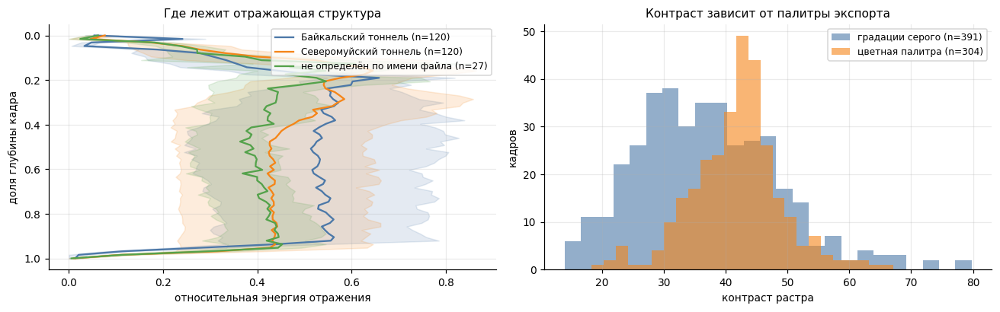

In [11]:
def depth_profile(path, n=64):
    a = np.asarray(Image.open(path).convert("L")).astype(np.float32)
    a = a - a.mean(axis=1, keepdims=True)              # убираем горизонтальные помехи
    e = np.abs(a).mean(axis=1)
    idx = np.linspace(0, len(e) - 1, n)
    return np.interp(idx, np.arange(len(e)), e) / max(e.max(), 1e-6)


fig, ax = plt.subplots(1, 2, figsize=(12, 3.8))
for obj, color in zip(sorted(chk["объект"].unique()), ["#4C78A8", "#F58518", "#54A24B"]):
    sub = chk[chk["объект"] == obj]
    prof = np.array([depth_profile(f) for f in sub["файл"].sample(min(120, len(sub)), random_state=SEED)])
    m, lo, hi = prof.mean(0), np.percentile(prof, 25, 0), np.percentile(prof, 75, 0)
    y = np.linspace(0, 1, len(m))
    ax[0].plot(m, y, color=color, label=f"{obj} (n={len(prof)})")
    ax[0].fill_betweenx(y, lo, hi, color=color, alpha=0.15)
ax[0].invert_yaxis(); ax[0].set_xlabel("относительная энергия отражения")
ax[0].set_ylabel("доля глубины кадра"); ax[0].legend(fontsize=8)
ax[0].set_title("Где лежит отражающая структура", fontsize=10)

for pal_name, color in [("градации серого", "#4C78A8"), ("цветная палитра", "#F58518")]:
    sub = chk[chk["палитра"] == pal_name]
    if len(sub):
        ax[1].hist(sub["контраст"], bins=25, alpha=0.6, color=color, label=f"{pal_name} (n={len(sub)})")
ax[1].set_xlabel("контраст растра"); ax[1].set_ylabel("кадров"); ax[1].legend(fontsize=8)
ax[1].set_title("Контраст зависит от палитры экспорта", fontsize=10)
plt.tight_layout(); plt.show()

### 3.4. Что написано в отчётах

Расшифровка инженера извлечена из текста `.doc` и относится к документу целиком.
Это не разметка, но показывает, какие дефекты вообще встречаются на объектах.

In [12]:
MENTION_ORDER = ["расслоение", "трещины", "пустоты", "разуплотнение", "обводнённость", "арматура"]
m_rows = []
for obj, sub in chk.groupby("объект"):
    docs_ = sub.drop_duplicates("документ")
    for k in MENTION_ORDER:
        n_doc = sum(k in str(x) for x in docs_["упоминания"])
        n_img = sum(k in str(x) for x in sub["упоминания"])
        m_rows.append({"объект": obj, "дефект": k, "документов": n_doc, "кадров из них": n_img})
M = pd.DataFrame(m_rows)
display(M.pivot(index="дефект", columns="объект", values="документов").fillna(0).astype(int)
         .reindex(MENTION_ORDER))
print("в скольких документах упомянут дефект (всего документов: "
      f"{chk['документ'].nunique()})")

объект,Байкальский тоннель,Северомуйский тоннель,не определён по имени файла
дефект,,,
расслоение,3,6,1
трещины,7,6,1
пустоты,5,4,1
разуплотнение,1,2,0
обводнённость,7,6,1
арматура,7,6,1


в скольких документах упомянут дефект (всего документов: 14)


---
## 4. Прогон наших моделей

### 4.1. Предобработка

Модели обучены на сырых растрах B-сканов в градациях серого. Здесь же — экспорт из
«Геоскан-32»: с белыми полями, подписями осей и, у трети кадров, цветной палитрой.
Поля обрезаются, цвет убирается. Масштаб согласовать нельзя: сколько метров профиля
приходится на кадр, в растре не записано.

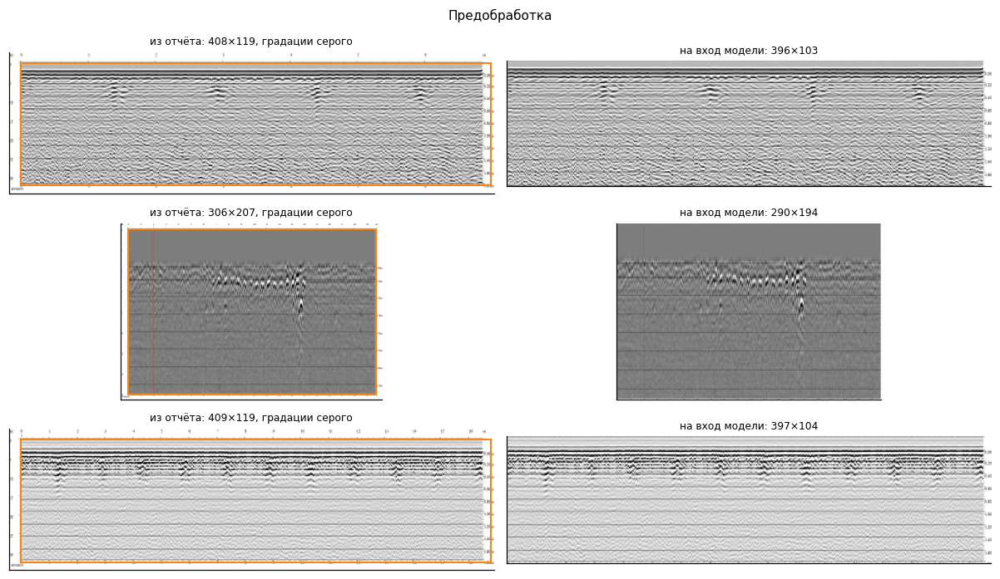

In [13]:
def crop_plot(path, white=225, frac=0.80):
    """Обрезает белые поля с подписями осей, оставляя растр профиля."""
    im = Image.open(path).convert("L")
    a = np.asarray(im).astype(np.float32)
    rows_ = (a > white).mean(1) < frac
    cols_ = (a > white).mean(0) < frac
    if rows_.sum() < 16 or cols_.sum() < 16:
        return im, (0, 0, a.shape[1], a.shape[0])
    y0, y1 = np.flatnonzero(rows_)[[0, -1]]
    x0, x1 = np.flatnonzero(cols_)[[0, -1]]
    return im.crop((int(x0), int(y0), int(x1 + 1), int(y1 + 1))), (int(x0), int(y0), int(x1 + 1), int(y1 + 1))


demo = chk.sample(3, random_state=SEED)
fig, axes = plt.subplots(len(demo), 2, figsize=(11, 2.2 * len(demo)))
for ax_row, (_, r) in zip(np.atleast_2d(axes), demo.iterrows()):
    orig = Image.open(r["файл"]).convert("RGB")
    cropped, box = crop_plot(r["файл"])
    ax_row[0].imshow(np.asarray(orig))
    ax_row[0].add_patch(mpatch.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                         fill=False, edgecolor="#F58518", lw=1.4))
    ax_row[0].set_title(f"из отчёта: {orig.size[0]}×{orig.size[1]}, {r['палитра']}", fontsize=8)
    ax_row[1].imshow(np.asarray(cropped), cmap="gray")
    ax_row[1].set_title(f"на вход модели: {cropped.size[0]}×{cropped.size[1]}", fontsize=8)
    for a_ in ax_row:
        a_.set_xticks([]); a_.set_yticks([]); a_.grid(False)
plt.suptitle("Предобработка", fontsize=10); plt.tight_layout(); plt.show()

### 4.2. Контрольная группа

Разметки у этих данных нет, поэтому ни precision, ни recall посчитать невозможно.
Единственное, что можно измерить без разметки, — **насколько находки модели зависят
от того, что ей показали**. Для этого нужен заведомо бессмысленный вход.

Он есть в тех же отчётах: фотографии обделки, пути и аппаратуры. Дефекта на
радарограмме там быть не может по построению, поэтому любое срабатывание ложное.
Фотографии берутся из тех же четырнадцати `.doc` и в каталог `docs/images/` не
попадают — они лежат в рабочем каталоге.

In [14]:
# Список контрольных фотографий собран в разделе 2: это те же снимки, по которым
# калибровались пороги проверки, — из тех же четырнадцати отчётов.
print(f"контрольных фотографий из тех же .doc: {len(control_files)}")
print("для них дефект на георадарограмме невозможен по построению, "
      "поэтому любое срабатывание там ложное")

контрольных фотографий из тех же .doc: 96
для них дефект на георадарограмме невозможен по построению, поэтому любое срабатывание там ложное


### 4.3. Три модели

По одной на каждый обучающий домен основной работы — так видно, какой из них ближе
к реальной тоннельной обделке.

In [15]:
MODELS = {
    "E0 синтетика TunGPR": (RUNS / "e0_src_tunnel/weights/best.pt",
                            ["rebar", "grout_surface", "rock_surface", "separation", "air_void", "water_void"]),
    "E1b железобетон P-GPR": (RUNS / "e1b_concrete_tungpr/weights/best.pt", ["steel", "pipe"]),
    "E2a дороги URDD": (RUNS / "e2a_road_coco/weights/best.pt",
                        ["Cavity", "Detachment", "Looseness", "Water-rich"]),
}
RU = {"rebar": "арматура", "grout_surface": "граница нагнетания", "rock_surface": "граница породы",
      "separation": "расслоение", "air_void": "воздушная пустота", "water_void": "водная пустота",
      "steel": "арматура", "pipe": "труба", "Cavity": "пустота", "Detachment": "отслоение",
      "Looseness": "разуплотнение", "Water-rich": "водонасыщение"}
CONF = 0.25


def run_model(weights, classes, files, conf=CONF, imgsz=640, batch=32):
    model = YOLO(str(weights))
    out = []
    for i in range(0, len(files), batch):
        chunk = files[i:i + batch]
        imgs, ok = [], []
        for f in chunk:
            try:
                im, _ = crop_plot(f)
                imgs.append(im.convert("RGB")); ok.append(f)
            except Exception:
                continue
        if not imgs:
            continue
        res = model.predict(imgs, conf=conf, imgsz=imgsz, verbose=False, device=DEVICE)
        for f, im, r in zip(ok, imgs, res):
            dets = []
            if r.boxes is not None and len(r.boxes):
                for c, cf, b in zip(r.boxes.cls.cpu().numpy().astype(int),
                                    r.boxes.conf.cpu().numpy(), r.boxes.xywhn.cpu().numpy()):
                    dets.append({"класс": classes[c], "уверенность": float(cf),
                                 "x": float(b[0]), "y": float(b[1]), "w": float(b[2]), "h": float(b[3])})
            out.append({"файл": f, "размер": im.size, "детекции": dets})
    return out


preds = {}
for name, (w, cls) in MODELS.items():
    preds[name] = {"радарограммы": run_model(w, cls, chk["файл"].tolist()),
                   "фотографии": run_model(w, cls, control_files)}
    print(f"{name}: объектов на радарограммах "
          f"{sum(len(x['детекции']) for x in preds[name]['радарограммы'])}, "
          f"на контрольных фото {sum(len(x['детекции']) for x in preds[name]['фотографии'])}")

E0 синтетика TunGPR: объектов на радарограммах 741, на контрольных фото 41
E1b железобетон P-GPR: объектов на радарограммах 6382, на контрольных фото 194
E2a дороги URDD: объектов на радарограммах 534, на контрольных фото 12


### 4.4. Сколько и чего нашлось

In [16]:
summary = []
for name in MODELS:
    for group in ("радарограммы", "фотографии"):
        p_ = preds[name][group]
        with_det = sum(1 for x in p_ if x["детекции"])
        n_obj = sum(len(x["детекции"]) for x in p_)
        confs = [d["уверенность"] for x in p_ for d in x["детекции"]]
        summary.append({"модель": name, "группа": group, "кадров": len(p_),
                        "кадров с находками": with_det,
                        "доля кадров": round(with_det / max(len(p_), 1), 3),
                        "объектов": n_obj,
                        "объектов на кадр": round(n_obj / max(len(p_), 1), 2),
                        "медианная уверенность": round(float(np.median(confs)), 3) if confs else np.nan})
S = pd.DataFrame(summary)
display(S)

piv = S.pivot(index="модель", columns="группа", values="доля кадров")
piv["отношение"] = (piv["радарограммы"] / piv["фотографии"].replace(0, np.nan)).round(2)
display(piv)
print("отношение около единицы означало бы, что находки модели неотличимы от "
      "срабатываний на постороннем изображении")

,модель,группа,кадров,кадров с находками,доля кадров,объектов,объектов на кадр,медианная уверенность
0,E0 синтетика TunGPR,радарограммы,695,495,0.712,741,1.07,0.606
1,E0 синтетика TunGPR,фотографии,96,29,0.302,41,0.43,0.423
2,E1b железобетон P-GPR,радарограммы,695,515,0.741,6382,9.18,0.344
3,E1b железобетон P-GPR,фотографии,96,41,0.427,194,2.02,0.325
4,E2a дороги URDD,радарограммы,695,178,0.256,534,0.77,0.360
5,E2a дороги URDD,фотографии,96,9,0.094,12,0.12,0.353


группа,радарограммы,фотографии,отношение
модель,,,
E0 синтетика TunGPR,0.712,0.302,2.36
E1b железобетон P-GPR,0.741,0.427,1.74
E2a дороги URDD,0.256,0.094,2.72


отношение около единицы означало бы, что находки модели неотличимы от срабатываний на постороннем изображении


In [17]:
rows = []
for name, (w, cls) in MODELS.items():
    for group in ("радарограммы", "фотографии"):
        c = Counter(d["класс"] for x in preds[name][group] for d in x["детекции"])
        n = max(len(preds[name][group]), 1)
        for k in cls:
            rows.append({"модель": name, "группа": group, "класс": RU.get(k, k),
                         "объектов": c.get(k, 0), "на 100 кадров": round(100 * c.get(k, 0) / n, 1)})
cls_df = pd.DataFrame(rows)
display(cls_df.pivot_table(index=["модель", "класс"], columns="группа",
                           values="на 100 кадров", fill_value=0))

группа                                    радарограммы  фотографии
модель                класс                                       
E0 синтетика TunGPR   арматура                     0.0         0.0
                      водная пустота               0.0         0.0
                      воздушная пустота            0.0         0.0
                      граница нагнетания           0.3         2.1
                      граница породы             106.3        40.6
                      расслоение                   0.0         0.0
E1b железобетон P-GPR арматура                    33.4         7.3
                      труба                      884.9       194.8
E2a дороги URDD       водонасыщение                0.0         0.0
                      отслоение                   16.8         5.2
                      пустота                     36.5         6.2
                      разуплотнение               23.5         1.0

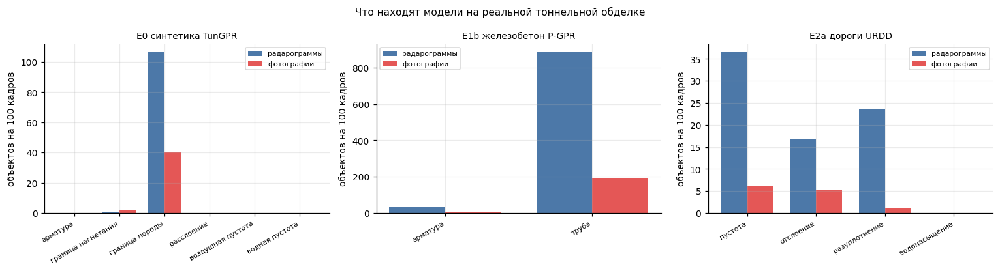

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(14, 3.8))
for ax, name in zip(axes, MODELS):
    sub = cls_df[cls_df["модель"] == name]
    classes = list(sub["класс"].unique())
    x = np.arange(len(classes)); wdt = 0.38
    for k, (group, color) in enumerate([("радарограммы", "#4C78A8"), ("фотографии", "#E45756")]):
        v = [sub[(sub["класс"] == c) & (sub["группа"] == group)]["на 100 кадров"].sum() for c in classes]
        ax.bar(x + (k - 0.5) * wdt, v, wdt, label=group, color=color)
    ax.set_xticks(x); ax.set_xticklabels(classes, rotation=30, ha="right", fontsize=7)
    ax.set_title(name, fontsize=9); ax.set_ylabel("объектов на 100 кадров"); ax.legend(fontsize=7)
plt.suptitle("Что находят модели на реальной тоннельной обделке", fontsize=10)
plt.tight_layout(); plt.show()

### 4.5. Уверенность и глубина находок

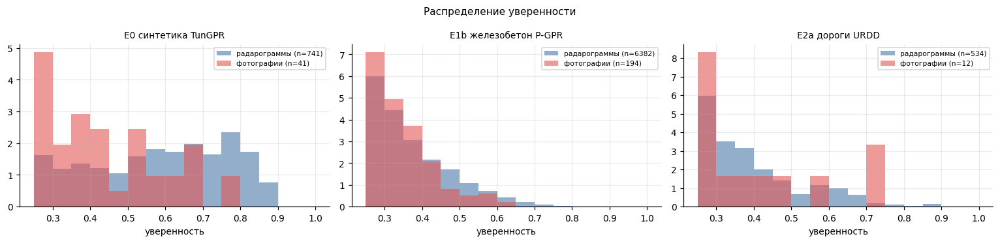

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(14, 3.4))
for ax, name in zip(axes, MODELS):
    for group, color in [("радарограммы", "#4C78A8"), ("фотографии", "#E45756")]:
        c = [d["уверенность"] for x in preds[name][group] for d in x["детекции"]]
        if c:
            ax.hist(c, bins=np.linspace(0.25, 1.0, 16), alpha=0.6, color=color,
                    label=f"{group} (n={len(c)})", density=True)
    ax.set_title(name, fontsize=9); ax.set_xlabel("уверенность"); ax.legend(fontsize=7)
plt.suptitle("Распределение уверенности", fontsize=10)
plt.tight_layout(); plt.show()

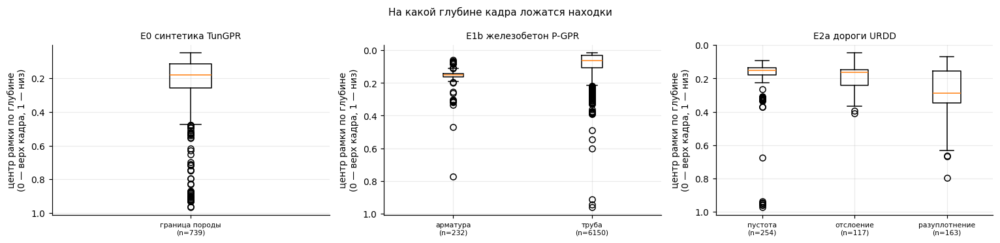

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(14, 3.4))
for ax, name in zip(axes, MODELS):
    ys, labels = [], []
    for k in MODELS[name][1]:
        v = [d["y"] for x in preds[name]["радарограммы"] for d in x["детекции"] if d["класс"] == k]
        if len(v) >= 5:
            ys.append(v); labels.append(f"{RU.get(k, k)}\n(n={len(v)})")
    if ys:
        ax.boxplot(ys, labels=labels, vert=True); ax.invert_yaxis()
    ax.set_ylabel("центр рамки по глубине\n(0 — верх кадра, 1 — низ)")
    ax.set_title(name, fontsize=9); ax.tick_params(axis="x", labelsize=7)
plt.suptitle("На какой глубине кадра ложатся находки", fontsize=10)
plt.tight_layout(); plt.show()

### 4.6. Совпадают ли модели между собой

Согласие двух независимо обученных моделей — ещё один довод в пользу того, что в
кадре действительно что-то есть. Ниже — на скольких кадрах сработали одновременно.

In [21]:
hit = {name: {x["файл"] for x in preds[name]["радарограммы"] if x["детекции"]} for name in MODELS}
names = list(MODELS)
agree = pd.DataFrame(index=names, columns=names, dtype=float)
for a in names:
    for b in names:
        inter = len(hit[a] & hit[b]); union = len(hit[a] | hit[b])
        agree.loc[a, b] = round(inter / union, 2) if union else np.nan
display(agree.rename_axis("доля совпадающих кадров (Жаккар)"))
print("кадров, где сработали все три модели:", len(hit[names[0]] & hit[names[1]] & hit[names[2]]))
print("кадров, где не сработала ни одна:", len(chk) - len(hit[names[0]] | hit[names[1]] | hit[names[2]]))

,E0 синтетика TunGPR,E1b железобетон P-GPR,E2a дороги URDD
доля совпадающих кадров (Жаккар),,,
E0 синтетика TunGPR,1.00,0.62,0.24
E1b железобетон P-GPR,0.62,1.00,0.27
E2a дороги URDD,0.24,0.27,1.00


кадров, где сработали все три модели: 108
кадров, где не сработала ни одна: 68


---
## 5. Примеры находок

Дальше — галереи. Подпись к каждому кадру указывает документ-источник, то есть
объект и месяц съёмки.

In [22]:
COLORS = {"rebar": "#F58518", "grout_surface": "#54A24B", "rock_surface": "#4C78A8",
          "separation": "#E45756", "air_void": "#B279A2", "water_void": "#72B7B2",
          "steel": "#F58518", "pipe": "#9D755D", "Cavity": "#E45756",
          "Detachment": "#4C78A8", "Looseness": "#EECA3B", "Water-rich": "#72B7B2"}
meta = chk.set_index("файл")[["документ", "объект", "палитра"]].to_dict("index")
idx = {name: {x["файл"]: x for x in preds[name]["радарограммы"]} for name in MODELS}


def draw(items, title, model_name, cols=2, only=None, height=2.0):
    """Сетка кадров с рамками одной модели."""
    if not items:
        print(f"{title}: подходящих кадров нет")
        return
    rows_n = int(np.ceil(len(items) / cols))
    fig, axes = plt.subplots(rows_n, cols, figsize=(cols * 6.2, rows_n * height))
    for ax, it in zip(np.atleast_1d(axes).ravel(), items):
        im, _ = crop_plot(it["файл"])
        W, H = im.size
        ax.imshow(np.asarray(im), cmap="gray", aspect="auto")
        for d in it["детекции"]:
            if only and d["класс"] != only:
                continue
            x0 = (d["x"] - d["w"] / 2) * W; y0 = (d["y"] - d["h"] / 2) * H
            ax.add_patch(mpatch.Rectangle((x0, y0), d["w"] * W, d["h"] * H, fill=False,
                                          edgecolor=COLORS.get(d["класс"], "#333"), lw=1.5))
            ax.text(x0, max(y0 - 2, 7), f"{RU.get(d['класс'], d['класс'])} {d['уверенность']:.2f}",
                    color=COLORS.get(d["класс"], "#333"), fontsize=6.5,
                    bbox=dict(facecolor="white", alpha=0.75, pad=0.4, edgecolor="none"))
        m = meta.get(it["файл"], {})
        ax.set_title(f"{m.get('объект','?')} · {Path(it['файл']).name[:46]}", fontsize=6.5)
        ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
    for ax in np.atleast_1d(axes).ravel()[len(items):]:
        ax.axis("off")
    plt.suptitle(title, fontsize=10); plt.tight_layout(); plt.show()


def top_by(model_name, cls=None, n=6, low=0.0, high=1.01, order="conf"):
    """Кадры, отсортированные по максимальной уверенности нужного класса."""
    out = []
    for x in preds[model_name]["радарограммы"]:
        ds = [d for d in x["детекции"] if (cls is None or d["класс"] == cls)]
        ds = [d for d in ds if low <= d["уверенность"] < high]
        if ds:
            out.append((max(d["уверенность"] for d in ds), x))
    out.sort(key=lambda t: -t[0] if order == "conf" else t[0])
    return [x for _, x in out[:n]]

### 5.1. Граница сред — единственное, что модель на синтетике находит уверенно

Самые уверенные находки E0. Обратите внимание на форму рамок: они почти всегда
растянуты на всю ширину кадра и охватывают верхнюю слоистую полосу.

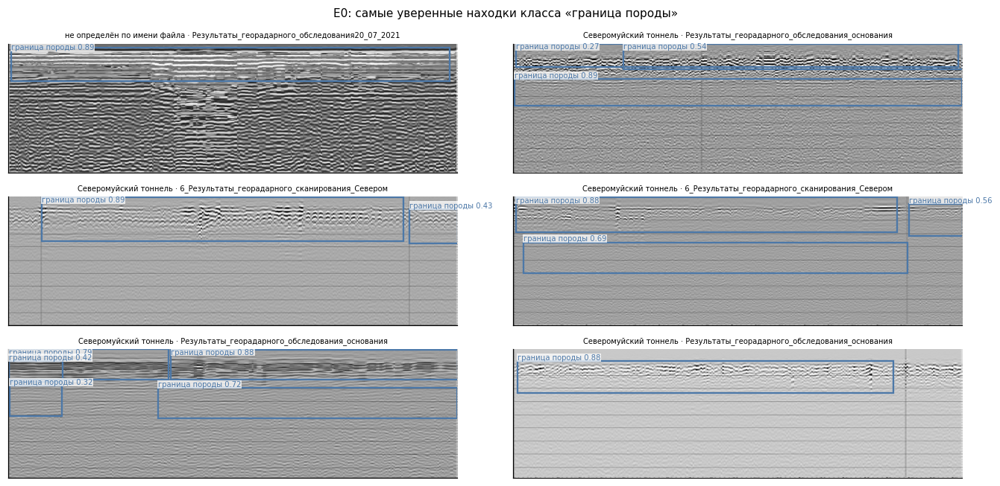

In [23]:
draw(top_by("E0 синтетика TunGPR", "rock_surface", n=6), 
     "E0: самые уверенные находки класса «граница породы»", "E0 синтетика TunGPR")

А это находки той же модели у нижней границы порога — там, где она сомневается.

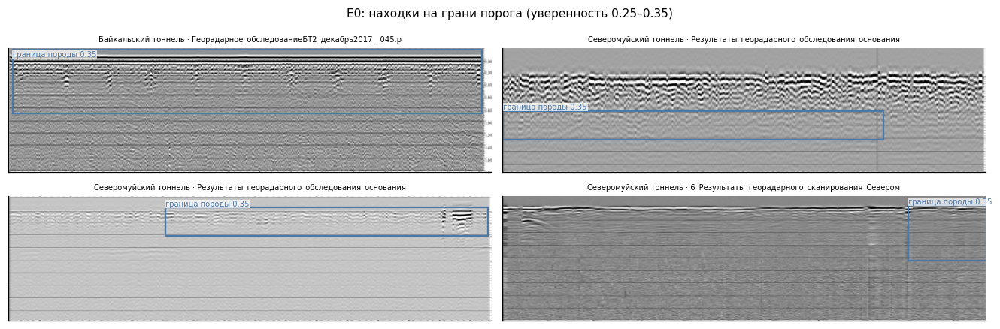

In [24]:
draw(top_by("E0 синтетика TunGPR", "rock_surface", n=4, low=0.25, high=0.35),
     "E0: находки на грани порога (уверенность 0.25–0.35)", "E0 синтетика TunGPR")

### 5.2. Редкие классы E0

Классов дефектов у этой модели шесть, но на реальных данных почти все молчат.
Ниже — всё, что нашлось по классам, отличным от границ сред. Это полный список, а не
выборка.

In [25]:
rare = [x for x in preds["E0 синтетика TunGPR"]["радарограммы"]
        if any(d["класс"] not in ("rock_surface", "grout_surface") for d in x["детекции"])]
print(f"кадров с находками классов дефектов: {len(rare)} из {len(chk)}")
draw(rare[:6], "E0: все находки классов дефектов (арматура, расслоение, пустоты)",
     "E0 синтетика TunGPR")

кадров с находками классов дефектов: 0 из 695
E0: все находки классов дефектов (арматура, расслоение, пустоты): подходящих кадров нет


### 5.3. Дорожная модель: пустоты, отслоения, разуплотнения

E2a обучена на дорожных дефектах и предъявляет на тоннельных профилях именно их.
Проверить эти находки нечем, поэтому смотрим на то, как они выглядят: локализованы
ли, повторяются ли от кадра к кадру, привязаны ли к особенностям сигнала.

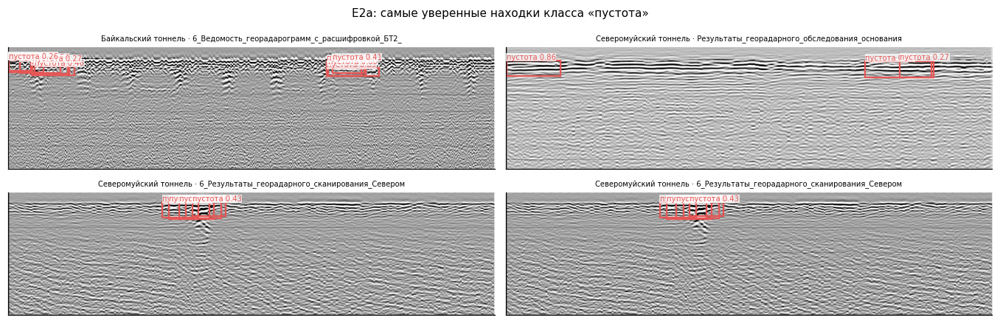

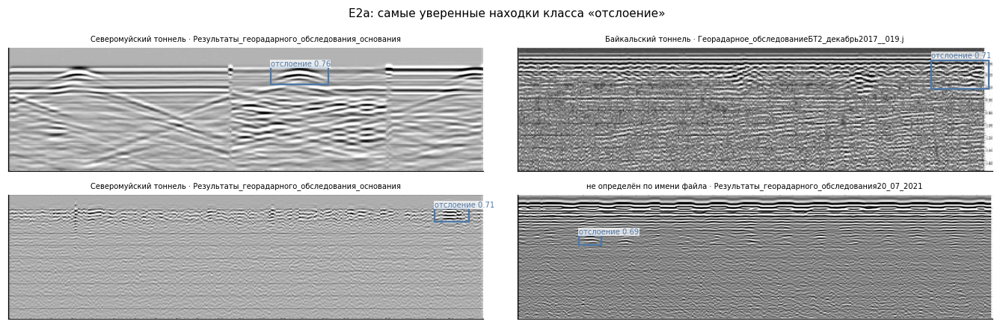

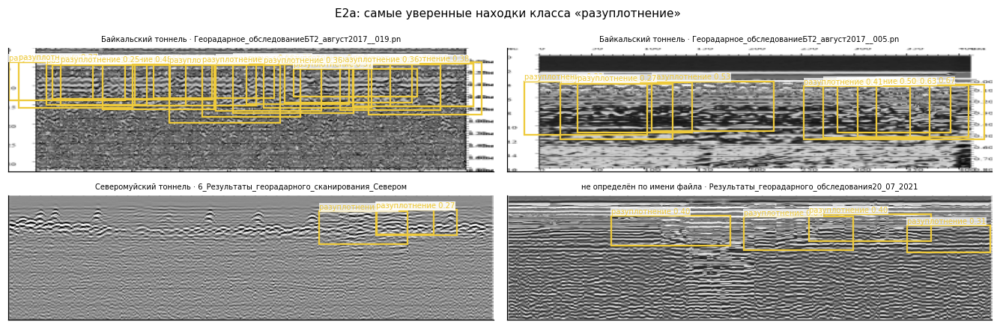

In [26]:
for cls in ["Cavity", "Detachment", "Looseness"]:
    draw(top_by("E2a дороги URDD", cls, n=4), 
         f"E2a: самые уверенные находки класса «{RU[cls]}»", "E2a дороги URDD", only=cls)

### 5.4. Кадры, где сработали все три модели

Три независимо обученные модели, три разных обучающих домена. Совпадение не
доказывает наличия дефекта, но показывает, что в кадре есть что-то заметное.

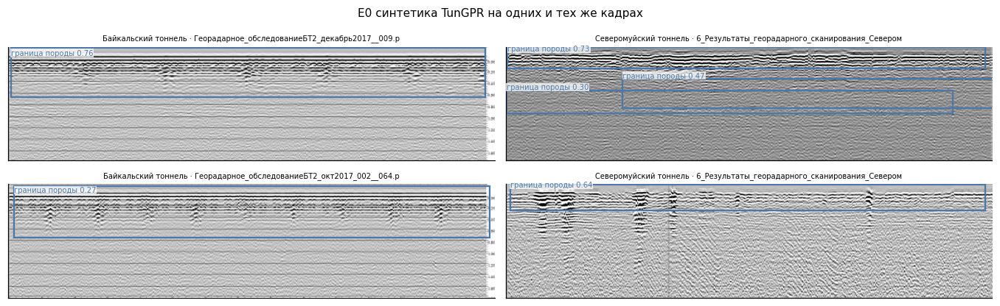

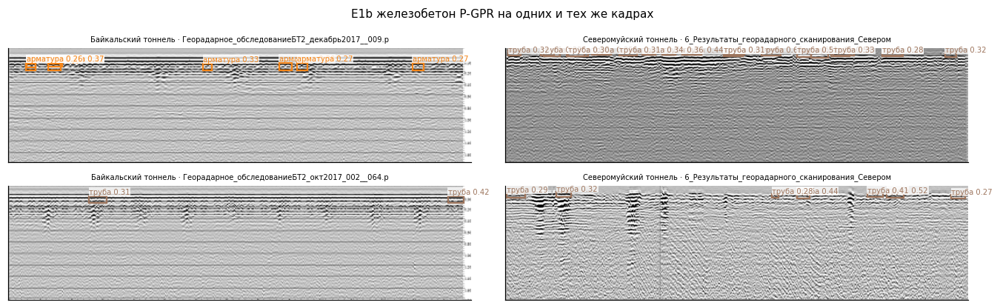

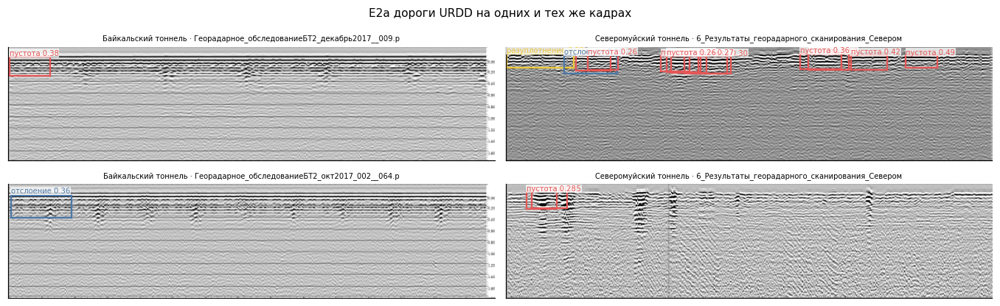

In [27]:
common = hit[names[0]] & hit[names[1]] & hit[names[2]]
pick = list(common)[:4]
for name in MODELS:
    draw([idx[name][f] for f in pick if f in idx[name]],
         f"{name} на одних и тех же кадрах", name, cols=2, height=1.9)

### 5.5. Цветные палитры

Треть кадров экспортирована в цветных палитрах «Геоскан». После перевода в градации
серого сигнал искажается: то, что в палитре было контрастным, может стать ровным.
Здесь видно, как модели ведут себя на таких кадрах.

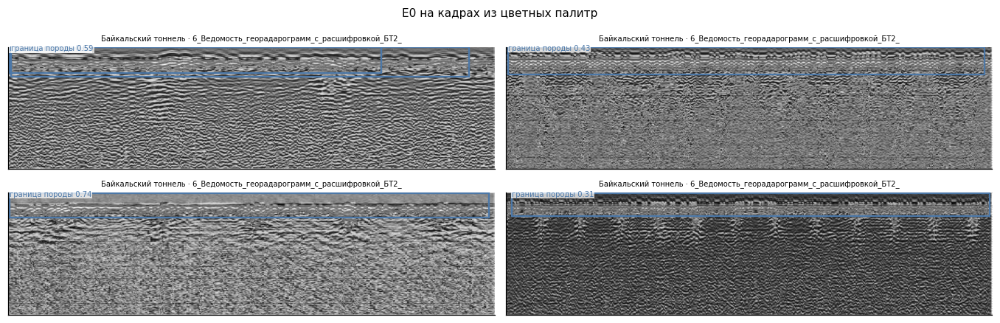

In [28]:
color_files = set(chk[chk["палитра"] == "цветная палитра"]["файл"])
draw([x for x in preds["E0 синтетика TunGPR"]["радарограммы"]
      if x["файл"] in color_files and x["детекции"]][:4],
     "E0 на кадрах из цветных палитр", "E0 синтетика TunGPR", cols=2)

### 5.6. Кадры, где не нашлось ничего

Их полезно посмотреть отдельно: если модель молчит на профилях, которые визуально
ничем не отличаются от тех, где она срабатывает, значит её решение неустойчиво.

кадров без единой находки: 68


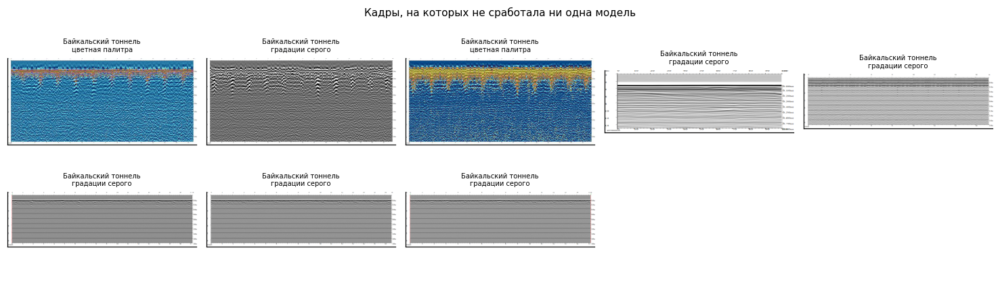

In [29]:
silent = [f for f in chk["файл"] if f not in (hit[names[0]] | hit[names[1]] | hit[names[2]])]
print(f"кадров без единой находки: {len(silent)}")
if silent:
    sub = chk[chk["файл"].isin(silent[:8])]
    sheet(sub, "Кадры, на которых не сработала ни одна модель",
          cap=lambda r: f"{r['объект']}\n{r['палитра']}")

---
## 6. Выводы

### 6.1. О самих данных

**Каталог однороден.** Все 695 изображений прошли три независимо откалиброванных
критерия, ни одна из 96 контрольных фотографий не прошла ни одного. По доле белого
поля группы не пересекаются даже хвостами. При этом проверка не была формальностью:
в первой версии каталога она нашла четыре посторонних изображения — подпись,
снимок экрана и две диаграммы, — и заодно показала, что исходная интуиция
(«радарограмма слоистая, фотография нет») перевёрнута: фотография как раз гладкая,
а радарограмма почти шумовая.

**Набор меньше, чем кажется.** Из 695 кадров побайтно уникальны 617, перцептивно —
613. Причём 74 группы копий лежат в **разных документах**, а два отчёта —
«Северомуйский тоннель июнь» и «июль» — оказались побайтно одним и тем же файлом под
разными именами. Для обучения это критично: при случайном разбиении одинаковые кадры
попадут и в обучение, и в контроль, и оценка окажется завышенной. Дедупликацию здесь
придётся делать обязательно, как и в основной работе.

**Съёмки разнородны.** Четырнадцать отчётов дают кадры от 380×115 до 661×362
пикселей, треть — в цветных палитрах «Геоскан» вместо градаций серого. Масштаб
(сколько метров профиля в кадре) в растре не записан. Это делает набор пригодным
для разметки, но требует приведения к общему виду перед обучением.

### 6.2. Что нашли модели

| Модель | доля кадров с находками | то же на фотографиях | отношение |
|---|---:|---:|---:|
| E0 синтетика TunGPR | 0.712 | 0.302 | 2.4 |
| E1b железобетон P-GPR | 0.741 | 0.427 | 1.7 |
| E2a дороги URDD | 0.256 | 0.094 | 2.7 |

Отношение больше единицы у всех трёх: георадарограмма для моделей — не то же самое,
что произвольная картинка. Но и до уверенного различения далеко, каждая третья
фотография вызывает срабатывание E0.

**Единственное, что находится устойчиво, — граница сред.** E0 выдаёт класс
`граница породы` 106 раз на 100 кадров, то есть примерно по одному объекту на
профиль, с медианной уверенностью 0.61. Рамки растянуты почти на всю ширину кадра и
охватывают верхнюю отражающую полосу — модель обводит слоистую зону целиком, а не
указывает на локальную особенность.

**Дефектов не найдено ни одного.** Из 741 объекта, выданного E0 на 695 реальных
профилях, к классам дефектов не относится **ни один**: арматура, расслоение,
воздушная и водная пустота — по нулю. Это главный результат раздела, и он
отрицательный.

**Детектор железобетона выродился.** E1b выдаёт 9.2 объекта на кадр и 885 «труб» на
100 профилей — разбирает слоистую текстуру на гиперболы, которых там нет. У него же
худшее отношение к контрольной группе (1.7). На этом домене модель непригодна.

**Находки дорожной модели проверить нечем.** E2a предъявляет пустоты (36 на 100
кадров), разуплотнения (24) и отслоения (17). По виду они локализованы и привязаны к
особенностям сигнала, но разметки нет, а поведение неустойчиво: на одних профилях
одна-две аккуратные рамки, на других — десятки перекрывающихся.

### 6.3. Согласие моделей

Три модели обучены на трёх разных доменах, и их согласие могло бы служить косвенным
доводом. Оно среднее: E0 и E1b совпадают по кадрам на 0.62 (мера Жаккара), E0 и
E2a — на 0.24, E1b и E2a — на 0.27. Все три срабатывают одновременно на 108 кадрах
из 695, ни одна — на 68.

Высокое согласие E0 и E1b объясняется просто: обе реагируют на верхнюю слоистую
полосу, только называют её по-разному — «граница породы» и «труба». Это согласие
общего признака, а не независимое подтверждение.

### 6.4. Чем оказалась «граница сред»

Контрольная группа отвечает на этот вопрос прямо. На фотографиях из тех же отчётов
E0 выдаёт класс «граница породы» с частотой 41 объект на 100 снимков и с уверенностью
до 0.67 — при том, что георадарограммы там нет вовсе. При просмотре видно, на что
именно попадают рамки: на рельсы, кромку лотка и границы стен. То есть выученный
признак **геометрический, а не физический**: это детектор протяжённой горизонтальной
структуры. На радарограмме таких структур больше, поэтому и срабатываний больше.

Это объясняет и то, почему переносится именно граница сред, и то, почему не
переносится ни один класс дефектов. Граница среды на B-скане — длинная горизонтальная
линия, её форму модель выучила на синтетике и узнаёт где угодно. Дефект — локальная
особенность, которую нужно отличать от фона по характеру отражения, и этому
синтетика не научила.

### 6.5. Ограничения

1. **Ни одной рамки истины.** Всё количественное здесь — частоты срабатываний и
   сравнение с контрольной группой. Ни precision, ни recall посчитать нельзя.
2. **Мы работаем с картинками, а не с данными.** В отчёты попали растры, уже
   отрисованные «Геоскан-32»: с наложенным усилением, своей палитрой, неизвестным
   масштабом. Амплитуда трассы потеряна.
3. **Контрольная группа отвечает не на все вопросы.** Фотография показывает, что
   модель срабатывает не на любом изображении. Она не говорит, как модель ведёт себя
   на чистом участке обделки без дефекта, — для этого нужна размеченная выборка.
4. **Порог один для всех моделей.** Значение 0.25 выбрано как рабочее, но у моделей
   разная калибровка уверенности, и сравнение частот между ними это учитывает лишь
   частично.

### 6.6. Что дальше

Главная ценность этого материала не в том, что показали детекторы, а в том, что
каталог существует. Он закрывает ограничение, стоявшее первым пунктом в выводах
основной работы:

* **695 профилей реальной тоннельной обделки** (617 уникальных) двух объектов за
  шесть лет — достаточно для дообучения, если их разметить;
* **расшифровка инженера** уже написана и извлечена в `docs/desc/`: она указывает,
  какие дефекты встречаются на объекте, и служит черновиком для разметчика;
* **повторные съёмки** одних участков в разные месяцы дают динамику — с поправкой на
  то, что часть «повторов» оказалась копиями одного файла.

Что нужно запросить дополнительно: исходные файлы «Геоскан» вместо растров,
привязку профилей к пикетам и рамки от интерпретатора. После этого отрицательные
результаты основной работы можно будет перепроверить уже на целевом домене.

In [30]:
итог = pd.DataFrame([
    {"показатель": "документов обработано", "значение": chk["документ"].nunique()},
    {"показатель": "георадарограмм в каталоге", "значение": len(chk)},
    {"показатель": "из них уникальных побайтно", "значение": int(chk["md5"].nunique())},
    {"показатель": "контрольных фотографий", "значение": len(control_files)},
    {"показатель": "прошли проверку на однородность", "значение": f"{int((~chk['подозрительна']).sum())} из {len(chk)}"},
    {"показатель": "объектов найдено, E0", "значение": sum(len(x["детекции"]) for x in preds["E0 синтетика TunGPR"]["радарограммы"])},
    {"показатель": "из них классов дефектов", "значение": sum(
        1 for x in preds["E0 синтетика TunGPR"]["радарограммы"] for d in x["детекции"]
        if d["класс"] not in ("rock_surface", "grout_surface"))},
    {"показатель": "кадров без единой находки любой модели", "значение": len(silent)},
])
display(итог)
print("\nНи один из 741 объекта, найденного моделью тоннельной обделки на реальных")
print("профилях, не относится к классам дефектов. Переносится структура, но не дефекты.")

,показатель,значение
0,документов обработано,14
1,георадарограмм в каталоге,695
2,из них уникальных побайтно,617
3,контрольных фотографий,96
4,прошли проверку на однородность,695 из 695
5,"объектов найдено, E0",741
6,из них классов дефектов,0
7,кадров без единой находки любой модели,68



Ни один из 741 объекта, найденного моделью тоннельной обделки на реальных
профилях, не относится к классам дефектов. Переносится структура, но не дефекты.
